<a href="https://colab.research.google.com/github/jaschn/DeepLearningProject/blob/main/Comparisons/Comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Getting 100 random COCO images to test on ##

Should check that they are not part of each of the training sets (in the future)

In [1]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
import datetime
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
!pip install fastai --upgrade

     |████████████████████████████████| 189 kB 5.1 MB/s 
     |████████████████████████████████| 56 kB 4.7 MB/s 
  Attempting uninstall: fastai
    Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [3]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
print(coco_path)


/root/.fastai/data/coco_sample/train_sample


In [4]:
paths = glob.glob(coco_path + "/*.jpg") # Grabbing all the image file names
np.random.seed(555)
paths_subset = np.random.choice(paths, 100, replace=False) # choosing 100 images randomly

## Visualizing the 100 testing images ## 

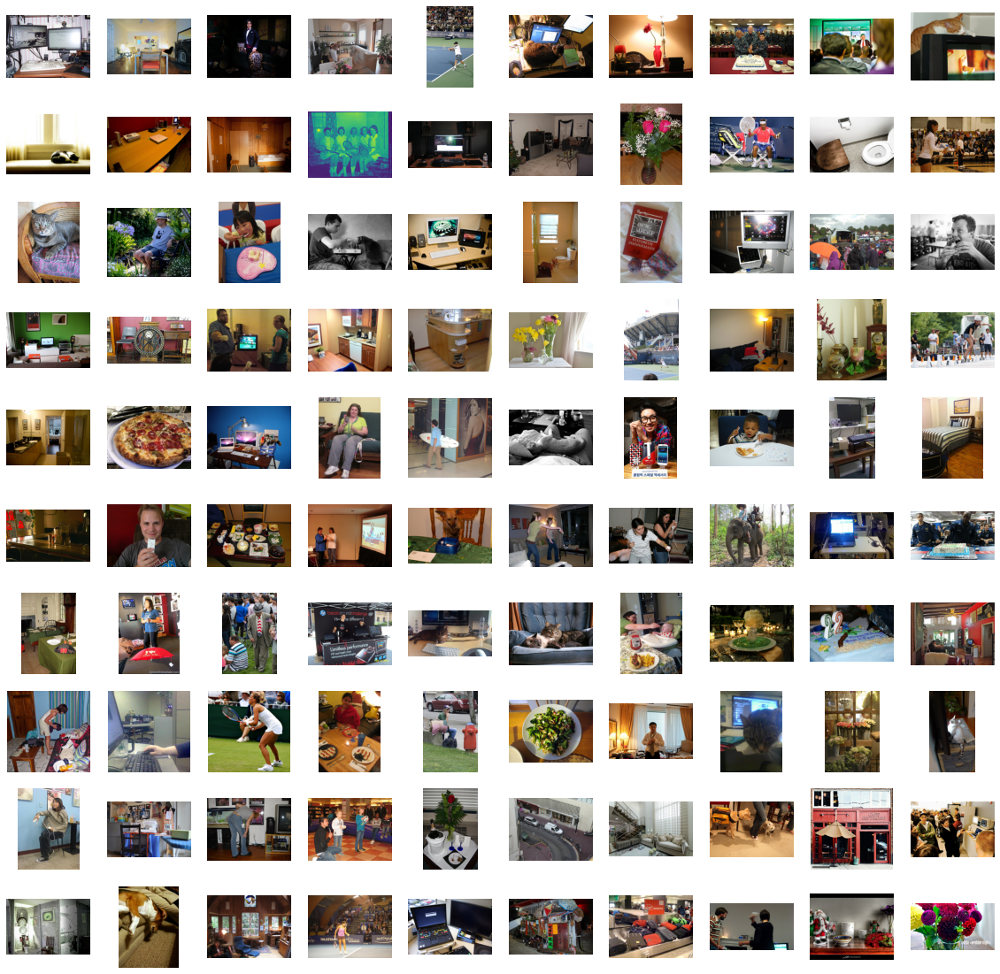

In [5]:
_, axes = plt.subplots(10, 10, figsize=(20, 20))
for ax, img_path in zip(axes.flatten(), paths_subset):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

## Loading a trained model ##

### Getting the model classes from a ipynb file on github 

In [6]:
#To get the trained models and class structures from github in the future (right now just uploaded the files to colab)
!git clone https://github.com/jaschn/02456_DeepLearningProject.git

Cloning into 'DeepLearningProject'...
remote: Enumerating objects: 519, done.
remote: Counting objects: 100% (519/519), done.
remote: Compressing objects: 100% (385/385), done.
remote: Total 519 (delta 308), reused 252 (delta 120), pack-reused 0
Receiving objects: 100% (519/519), 41.47 MiB | 9.55 MiB/s, done.
Resolving deltas: 100% (308/308), done.


In [7]:
os.chdir('DeepLearningProject')
os.chdir('Image_Colorization_Tutorial')
!ls

Branch 'cluster' set up to track remote branch 'cluster' from 'origin'.
Switched to a new branch 'cluster'
requirements.txt		       tut_basic_combined_v3.ipynb
setup_cartoons.sh		       tut_basic_deeper_model.ipynb
setup.sh			       tut_basic_generator_pretraining.ipynb
submit_adv.sh			       tut_basic_generator_pretraining_v1.ipynb
submit_basic_combined.sh	       tut_basic_generator_pretraining_v2.ipynb
submit_basic_combined_v1_cartoon.sh    tut_basic_generator_pretraining_v3.ipynb
submit_basic_deeper_model.sh	       tut_basic_generator_pretraining_v4.ipynb
submit_basic_generator_pretraining.sh  tut_basic.ipynb
submit_basic_label_smoothing.sh        tut_basic_label_smoothing.ipynb
submit_basic_losses.sh		       tut_basic_label_smoothing_v1.ipynb
submit_basic_lsgan.sh		       tut_basic_losses.ipynb
submit_basic_modified_model.sh	       tut_basic_losses_v1.ipynb
submit_basic_pretraining_lsgan.sh      tut_basic_losses_v2.ipynb
submit_basic.sh			       tut_basic_losses_v3.ipynb
tut_adv.ip

In [8]:
#Needed to use the model classes from the training ipynb file
!pip install import-ipynb
import import_ipynb

  Created wheel for import-ipynb: filename=import_ipynb-0.1.3-py3-none-any.whl size=2975 sha256=10e7ea673f82084ddf91a9209d8d81ebcca722a040e116a69bd4d26da68d15cd
  Stored in directory: /root/.cache/pip/wheels/b1/5e/dc/79780689896a056199b0b9f24471e3ee184fbd816df355d5f0
Successfully built import-ipynb


### Getting model weights from a file on drive

In [9]:
from google.colab import drive
drive.mount('/content/drive')

drive_path_basic = '/content/drive/MyDrive/deeplearning-models/old_wrong_sorting/basic_run_2021-11-16T203155.259027/g_basic.pt'
#drive_path_basic_deeper = '/content/drive/MyDrive/deeplearning-models/old_wrong_sorting/basic_deeper_model_v1_run_2021-11-18T010043.583361/g_basic_deeper_model_v1.pt'
drive_path_combined = '/content/drive/MyDrive/deeplearning-models/basic_combined_v1_run_2021-11-28T142210.313871/g_basic_combined_v1.pt'
drive_path_combined_cartoon = '/content/drive/MyDrive/deeplearning-models/basic_combined_v1_cartoon_run_2021-11-29T182632.935366/g_basic_combined_v1_cartoon.pt'
drive_path_full_adv = '/content/drive/MyDrive/deeplearning-models/adv_run_2021-11-29T195509.858849/full_model_adv.pt'
drive_path_adv = '/content/drive/MyDrive/deeplearning-models/adv_run_2021-11-29T195509.858849/g_adv.pt'

Mounted at /content/drive


In [11]:
#Importing the models for basic
from tut_basic import Unet, MainModel, make_dataloaders, lab_to_rgb, ColorizationDataset

In [12]:
#Creating the basic model
netG_basic = Unet(input_c=1, output_c=2, n_down=8, num_filters=64)
netG_basic.load_state_dict(torch.load(drive_path_basic, map_location=torch.device('cpu'))) #remove last part if on GPU
model_basic = MainModel(net_G = netG_basic)
model_basic.eval()

model initialized with norm initialization


MainModel(
  (net_G): Unet(
    (model): UnetBlock(
      (model): Sequential(
        (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): UnetBlock(
          (model): Sequential(
            (0): LeakyReLU(negative_slope=0.2, inplace=True)
            (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
            (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (3): UnetBlock(
              (model): Sequential(
                (0): LeakyReLU(negative_slope=0.2, inplace=True)
                (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
                (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (3): UnetBlock(
                  (model): Sequential(
                    (0): LeakyReLU(negative_slope=0.2, inplace=True)
                    (1): Conv2d(256, 512, kernel_s

In [14]:
#Importing models for combined (this overwrites the previous imported models)
from tut_basic_combined_v1 import Unet, MainModel, make_dataloaders, lab_to_rgb, ColorizationDataset 

In [15]:
#Creating the combined model and combined cartoon model
netG_combined = Unet(input_c=1, output_c=2, n_down=8, num_filters=64)
netG_combined.load_state_dict(torch.load(drive_path_combined, map_location=torch.device('cpu'))) #remove last part if on GPU
model_combined = MainModel(net_G = netG_combined)
model_combined.eval()

netG_combined_cartoon = Unet(input_c=1, output_c=2, n_down=8, num_filters=64)
netG_combined_cartoon.load_state_dict(torch.load(drive_path_combined_cartoon, map_location=torch.device('cpu'))) #remove last part if on GPU
model_combined_cartoon = MainModel(net_G = netG_combined_cartoon)
model_combined_cartoon.eval()

#Creating the basic deeper model
#netG_deeper = Unet(input_c=1, output_c=2, n_down=8, num_filters=128)
#netG_deeper.load_state_dict(torch.load(drive_path_basic_deeper, map_location=torch.device('cpu'))) #remove last part if on GPU
#model_deeper = MainModel(net_G = netG_deeper)

model initialized with kaiming initialization
model initialized with kaiming initialization


MainModel(
  (net_G): Unet(
    (model): UnetBlock(
      (model): Sequential(
        (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): UnetBlock(
          (model): Sequential(
            (0): LeakyReLU(negative_slope=0.2, inplace=True)
            (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
            (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (3): UnetBlock(
              (model): Sequential(
                (0): LeakyReLU(negative_slope=0.2, inplace=True)
                (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
                (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (3): UnetBlock(
                  (model): Sequential(
                    (0): LeakyReLU(negative_slope=0.2, inplace=True)
                    (1): Conv2d(256, 512, kernel_s

In [17]:
#Importing models for advanced (this overwrites the previous imported models)
from tut_adv import Unet, MainModel, make_dataloaders, lab_to_rgb, ColorizationDataset, build_res_unet

In [18]:
#Creating the advanced model
netG_adv = build_res_unet()
netG_adv.load_state_dict(torch.load(drive_path_adv, map_location=torch.device('cpu'))) #remove last part if on GPU
model_adv = MainModel(net_G=netG_adv)

model initialized with norm initialization


### Visualizing the results of different models

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWa

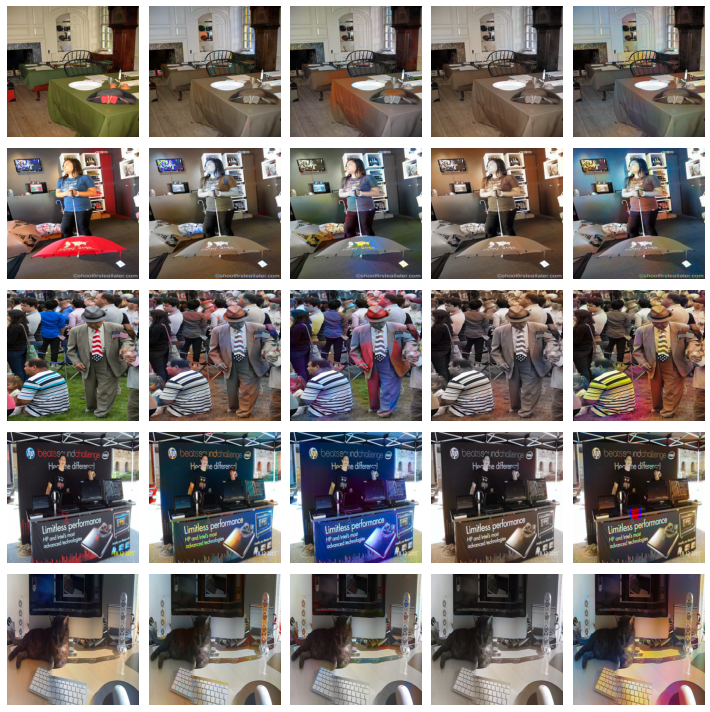

In [20]:
def visualize(dataloader, modelsList, instResults1 = None, instResults2 = None):
  allFakeImgs = []
  allRealImgs = []
  for model in modelsList:
    fake_imgs, real_imgs = testModel(dataloader, model)
    allFakeImgs.append(fake_imgs)
    allRealImgs.append(real_imgs)
  if instResults1 == None:
    plot_horizontal(len(modelsList), allFakeImgs, allRealImgs)
  else:
    plot_with_inst(len(modelsList), allFakeImgs, allRealImgs, instResults1, instResults2)
  return None

def testModel(dataloader, model):
  model.net_G.eval()
  data = next(iter(dataloader))
  with torch.no_grad():
    model.setup_input(data)
    model.forward()
  model.net_G.train()
  fake_color = model.fake_color.detach() 
  real_color = model.ab
  L = model.L
  fake_imgs = lab_to_rgb(L, fake_color)
  real_imgs = lab_to_rgb(L, real_color)
  return fake_imgs, real_imgs


def plot_vertical(nrOfModels, fakeImgs, realImgs):
  f = plt.figure(figsize=(15,10))
  for k in range(sampleNr):
    ax1 = f.add_subplot(nrOfModels+1, sampleNr, k + 1)
    ax1.imshow(realImgs[0][k])
    ax1.axis("off")
  for j in range(nrOfModels):
    for i in range(sampleNr):
      ax = f.add_subplot(nrOfModels+1, sampleNr, i + 1 + ((j+1)*sampleNr))
      ax.imshow(fakeImgs[j][i])
      ax.axis("off")
  f.tight_layout()
  plt.show()


def plot_horizontal(nrOfModels, fakeImgs, realImgs):
  f = plt.figure(figsize=(10,10))
  for k in range(sampleNr):
    ax1 = f.add_subplot(nrOfModels+1, sampleNr, (k*(nrOfModels+1)+1))
    ax1.imshow(realImgs[0][k])
    ax1.axis("off")
  for j in range(nrOfModels):
    for i in range(sampleNr):
      ax = f.add_subplot(nrOfModels+1, sampleNr, (i*(nrOfModels+1)+1)+((j*1)+1))
      ax.imshow(fakeImgs[j][i])
      ax.axis("off")
  f.tight_layout()
  plt.show()


sampleNr = 5
val_dl = make_dataloaders(paths=paths_subset[60:65], split='val')

modelList = [model_basic, model_adv, model_combined, model_combined_cartoon]
visualize(val_dl, modelList)

## Testing on manga/cartoon data

In [22]:
from skimage.io import imread
from skimage.transform import resize

In [23]:
#Load image paths form drive
drive_path_cartoon = '/content/drive/MyDrive/DeepLearnProject/cartoonImages'
drive_path_anime = '/content/drive/MyDrive/DeepLearnProject/animeImages'

image_paths_cartoon = glob.glob(drive_path_cartoon + "/*.jpg")
image_paths_anime = glob.glob(drive_path_anime + "/*.png")

print("Total Observations cartoon:\t", len(image_paths_cartoon))
print("Total Observations anime:\t", len(image_paths_anime))

Total Observations cartoon:	 15
Total Observations anime:	 15


In [24]:
#Check size of the images
image = imread(image_paths_cartoon[0])
print(image.shape)

(360, 640, 3)


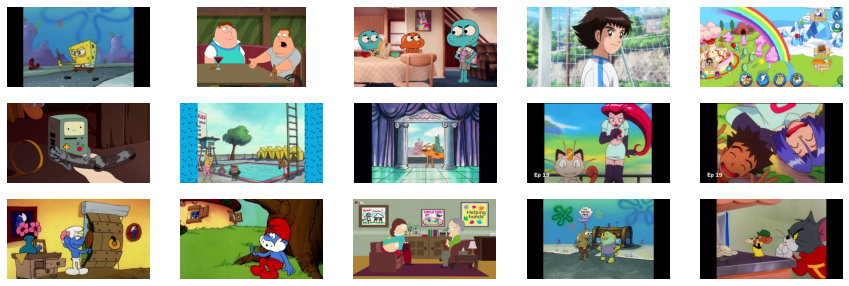

In [25]:
#Visualize cartoons
_, axes = plt.subplots(3, 5, figsize=(15, 5))
for ax, img_path in zip(axes.flatten(), image_paths_cartoon):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

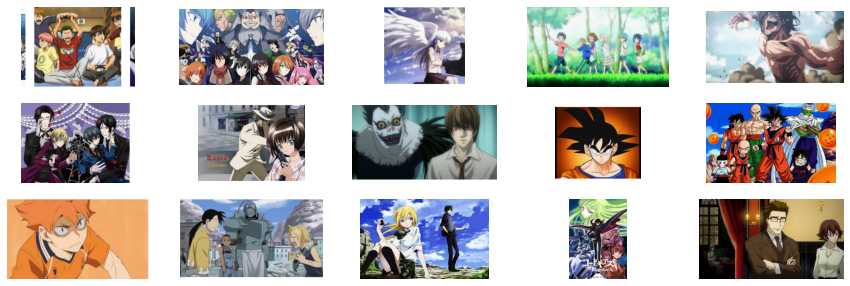

In [26]:
#Visualize anime
_, axes = plt.subplots(3, 5, figsize=(15, 5))
for ax, img_path in zip(axes.flatten(), image_paths_anime):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

### Testing models on cartoon images

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWa

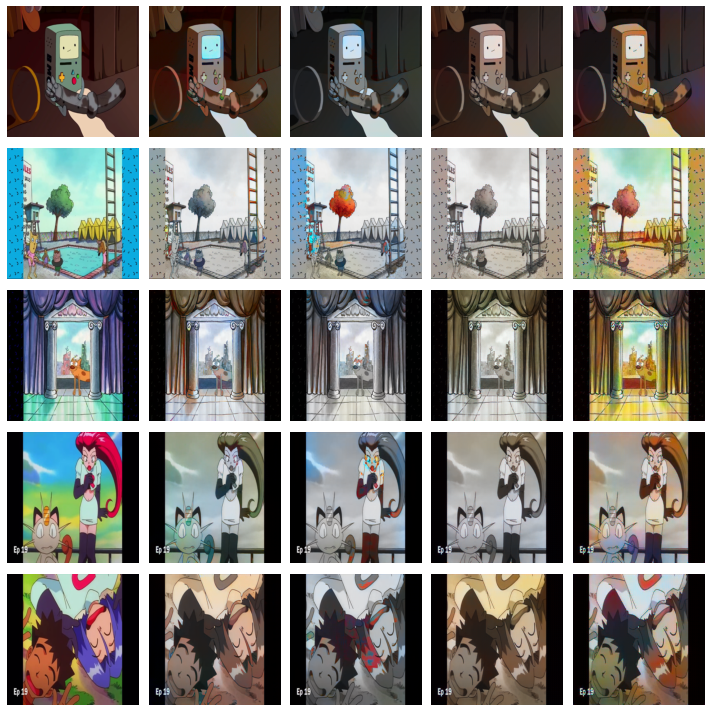

In [27]:
sampleNr = 5
val_dl_cartoon = make_dataloaders(paths=image_paths_cartoon[5:10], split='val')
visualize(val_dl_cartoon, [model_basic, model_adv, model_combined, model_combined_cartoon])  #model_deeper

### Testing models on anime images

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWa

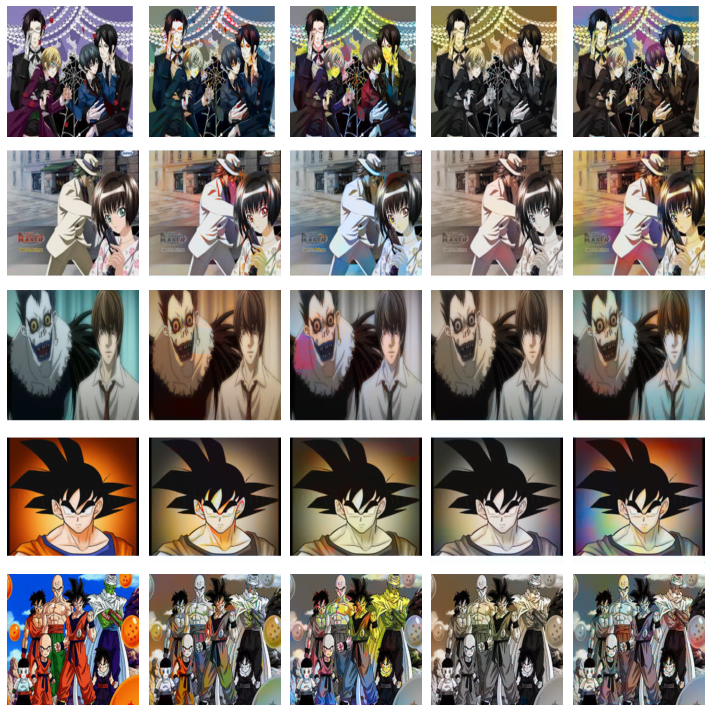

In [28]:
val_dl_anime = make_dataloaders(paths=image_paths_anime[5:10], split='val')
visualize(val_dl_anime, [model_basic, model_adv, model_combined, model_combined_cartoon]) #model_deeper

# Making poster images

## Real images

In [29]:
#Reading in preselected testing images frm drive

drive_path_real = '/content/drive/MyDrive/DeepLearnProject/posterImgsReal'
posterFiles = glob.glob(drive_path_real + "/*.jpg")

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWa

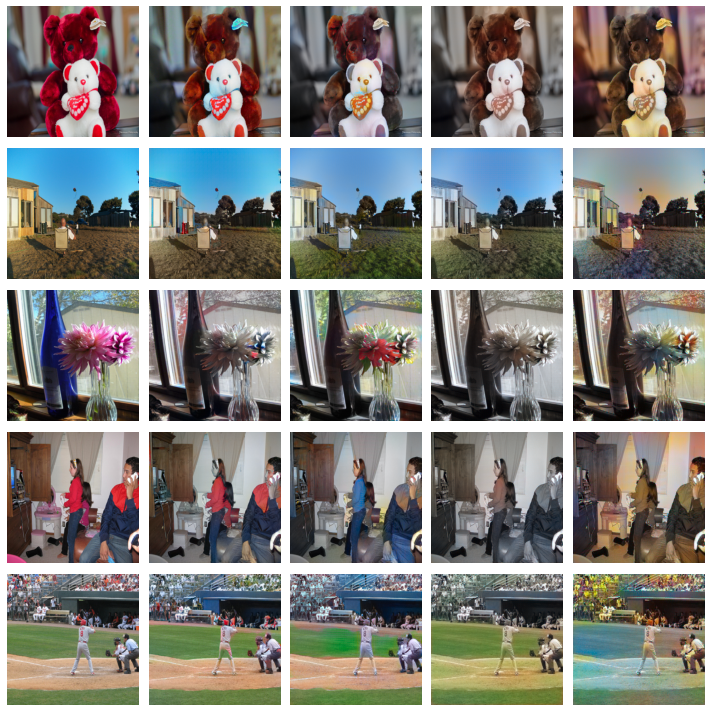

In [30]:
sampleNr = 5
poster_dl = make_dataloaders(paths=posterFiles, split='val')

modelList = [model_basic, model_adv, model_combined, model_combined_cartoon]
visualize(poster_dl, modelList) 

## Cartoon images

In [31]:
drive_path_cartoon = '/content/drive/MyDrive/DeepLearnProject/posterImgsCartoon'
posterFiles_cartoon_jpg = glob.glob(drive_path_cartoon + "/*.jpg")
posterFiles_cartoon_png = glob.glob(drive_path_cartoon + "/*.png")
posterFiles_cartoon = posterFiles_cartoon_jpg + posterFiles_cartoon_png

print("Total Observations cartoon:\t", len(posterFiles_cartoon))

Total Observations cartoon:	 5


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserW

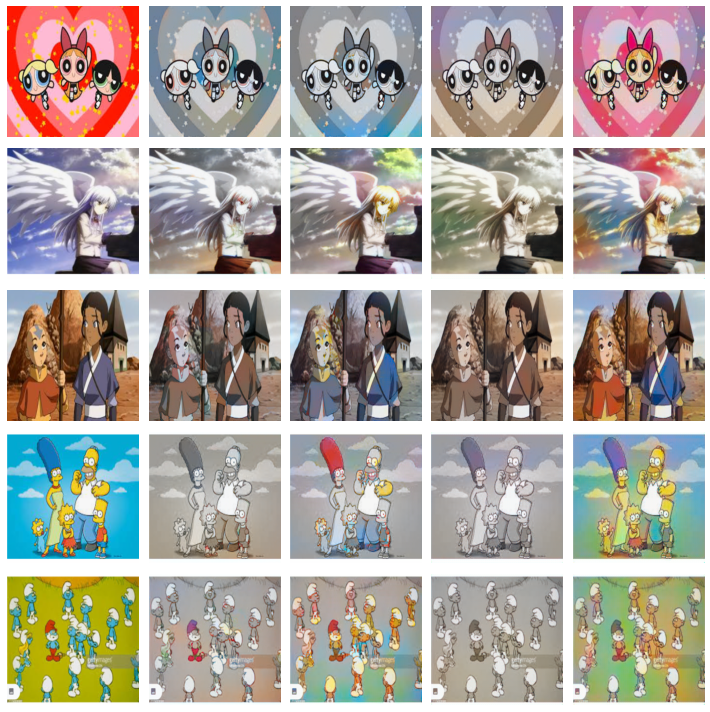

In [32]:
sampleNr = 5
poster_dl_cartoon = make_dataloaders(paths=posterFiles_cartoon[:5], split='val')

modelList = [model_basic, model_adv, model_combined, model_combined_cartoon]
visualize(poster_dl_cartoon, modelList)

## Adding instance aware image results

In [49]:
drive_path_inst_real = '/content/drive/MyDrive/DeepLearnProject/instReal'
drive_path_inst_cartoon = '/content/drive/MyDrive/DeepLearnProject/instCartoon'

drive_path_inst_real2 = '/content/drive/MyDrive/DeepLearnProject/instReal2'
drive_path_inst_cartoon2 = '/content/drive/MyDrive/DeepLearnProject/instCartoon2'

image_paths_inst_real = sorted(glob.glob(drive_path_inst_real + "/*.png"))
image_paths_inst_cartoon = sorted(glob.glob(drive_path_inst_cartoon + "/*.png"))

image_paths_inst_real2 = sorted(glob.glob(drive_path_inst_real2 + "/*.png"))
image_paths_inst_cartoon2 = sorted(glob.glob(drive_path_inst_cartoon2 + "/*.png"))

print("Total Observations real:\t", len(image_paths_inst_real))
print("Total Observations cartoon:\t", len(image_paths_inst_cartoon))


Total Observations real:	 5
Total Observations cartoon:	 5


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWa

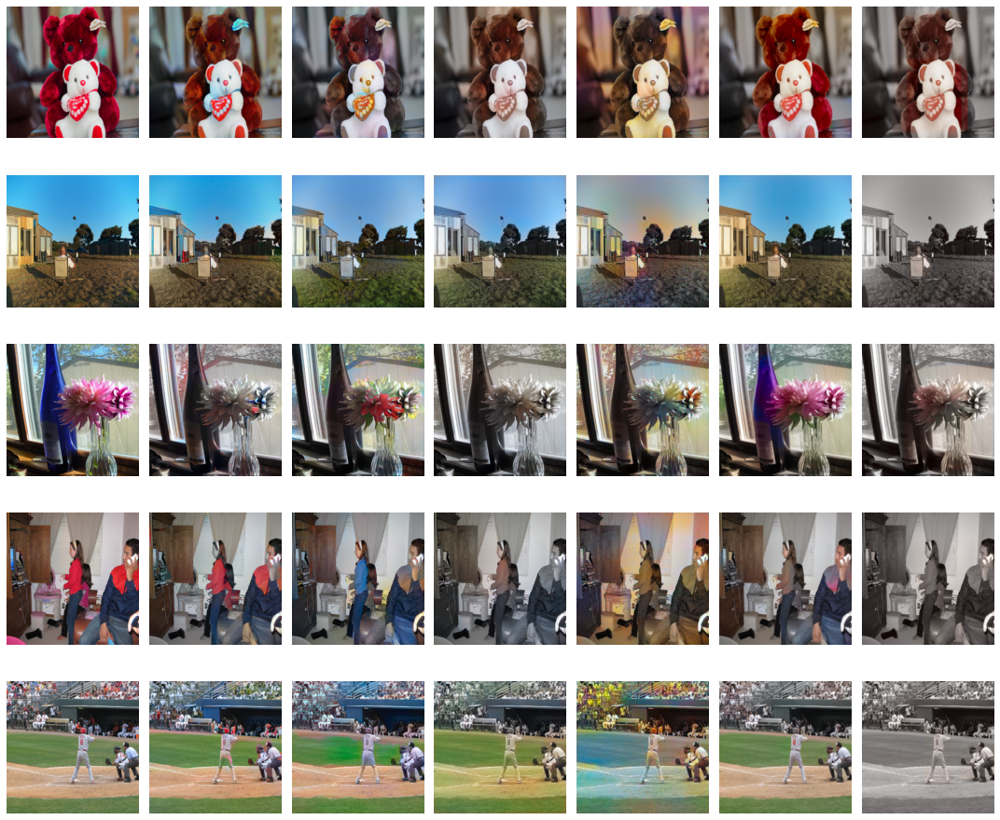

In [51]:
#altering the plotting fuction to use inst aware result too

def plot_with_inst(nrOfModels, fakeImgs, realImgs, instFakeImgs1, instFakeImgs2):
  f = plt.figure(figsize=(15,13))
  for k in range(sampleNr):
    ax1 = f.add_subplot(sampleNr, nrOfModels+3, (k*(nrOfModels+3)+1))
    ax1.imshow(realImgs[0][k])
    ax1.axis("off")
  for j in range(nrOfModels):
    for i in range(sampleNr):
      ax = f.add_subplot(sampleNr, nrOfModels+3, (i*(nrOfModels+3)+1)+((j*1)+1))
      ax.imshow(fakeImgs[j][i])
      ax.axis("off")
  for i in range(sampleNr):
      path = instFakeImgs1[i]
      ax = f.add_subplot(sampleNr, nrOfModels+3, (i*(nrOfModels+3)+1)+((4*1)+1))
      ax.imshow(Image.open(path))
      ax.axis("off")
  for i in range(sampleNr):
      path = instFakeImgs2[i]
      ax = f.add_subplot(sampleNr, nrOfModels+3, (i*(nrOfModels+3)+1)+((5*1)+1))
      ax.imshow(Image.open(path))
      ax.axis("off")
  f.tight_layout()
  #plt.savefig('fig4.png')
  plt.show()

#Getting the final plot
sampleNr = 5
poster_dl_cartoon = make_dataloaders(paths=posterFiles, split='val')
modelList = [model_basic, model_adv, model_combined, model_combined_cartoon]
visualize(poster_dl_cartoon, modelList, image_paths_inst_real, image_paths_inst_real2)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserW

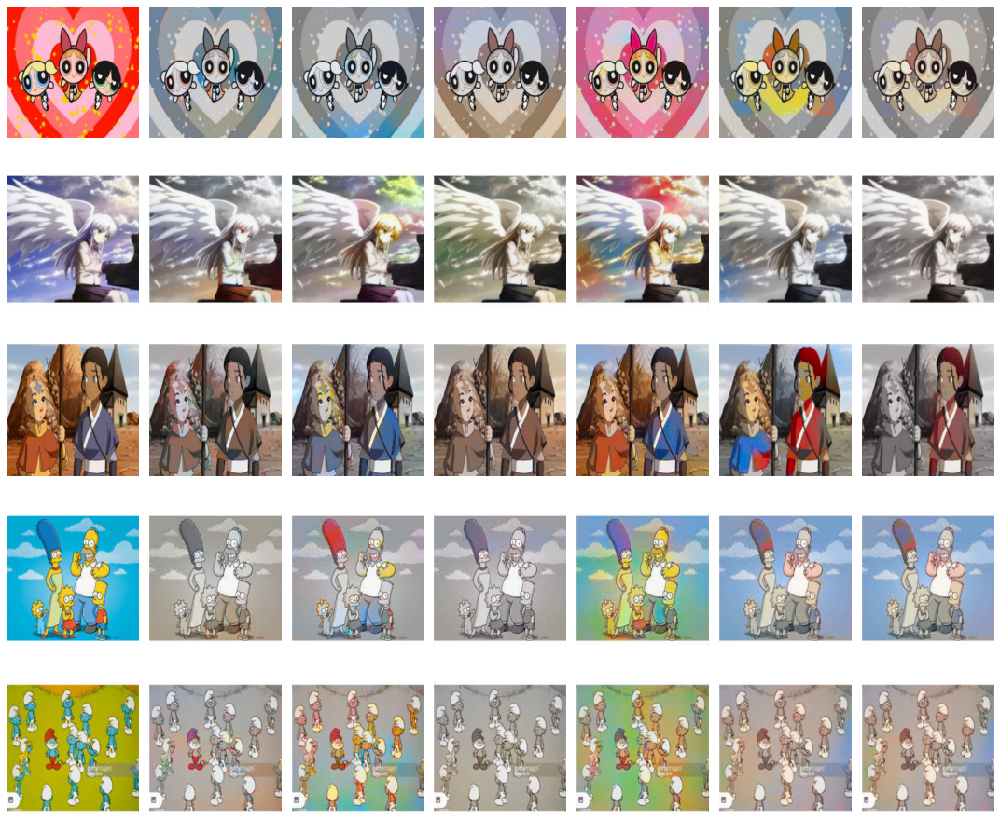

In [50]:
#Getting the final cartoon plot
sampleNr = 5
poster_dl_cartoon = make_dataloaders(paths=posterFiles_cartoon, split='val')
modelList = [model_basic, model_adv, model_combined, model_combined_cartoon]
visualize(poster_dl_cartoon, modelList, image_paths_inst_cartoon, image_paths_inst_cartoon2)